In [1]:
# Importar las librerías necesarias
import pandas as pd  
import numpy as np  
import matplotlib.pyplot as plt  
import seaborn as sns  
from pathlib import Path
import glob
import time

from sklearn.preprocessing import StandardScaler 
from sklearn.decomposition import PCA  
from sklearn.cluster import KMeans



In [2]:
# Establecer el random seed
random_seed = 42
np.random.seed(random_seed)

# Cargar y Explorar los Datos
Carga el archivo parquet usando pandas y realiza una exploración inicial de los datos, incluyendo estadísticas descriptivas y visualización de distribuciones.

In [3]:
# Cargar todos los archivos parquet que contienen 'merged_inmuebles24_departamentos_duckdb'
data_folder = '../../data/processed/final_datasets/'
pattern = f"{data_folder}*final_merged_inmuebles24*.parquet"

In [4]:

# Buscar todos los archivos que coincidan con el patrón
files = glob.glob(pattern)


In [5]:

print(f"Archivos encontrados: {len(files)}")
for file in files:
    print(f"  - {Path(file).name}")


Archivos encontrados: 6
  - final_merged_inmuebles24_2025-10-05.parquet
  - final_merged_inmuebles24_2025-09-14.parquet
  - final_merged_inmuebles24_2025-09-20.parquet
  - final_merged_inmuebles24_2025-08-31.parquet
  - final_merged_inmuebles24_2025-09-27.parquet
  - final_merged_inmuebles24_2025-10-11.parquet


In [6]:

# Leer y concatenar todos los archivos
if len(files) == 0:
    raise FileNotFoundError(f"No se encontraron archivos con el patrón: {pattern}")


In [7]:

dfs = []
for file in files:
    temp_df = pd.read_parquet(file)
    temp_df['source_file'] = Path(file).name  # Agregar columna con nombre del archivo fuente
    dfs.append(temp_df)
    print(f"Cargado: {Path(file).name} - {len(temp_df)} registros")


Cargado: final_merged_inmuebles24_2025-10-05.parquet - 4038 registros
Cargado: final_merged_inmuebles24_2025-09-14.parquet - 4197 registros
Cargado: final_merged_inmuebles24_2025-09-20.parquet - 3982 registros
Cargado: final_merged_inmuebles24_2025-08-31.parquet - 4094 registros
Cargado: final_merged_inmuebles24_2025-09-27.parquet - 4180 registros
Cargado: final_merged_inmuebles24_2025-10-11.parquet - 4172 registros


In [8]:
# Concatenar todos los DataFrames
df = pd.concat(dfs, ignore_index=True)

In [9]:
df.shape

(24663, 171)

### Análisis de duplicados

In [10]:
# Contar duplicados completos (todas las columnas)
duplicados_completos = df.duplicated().sum()
print(f"\n1. Duplicados completos (todas las columnas): {duplicados_completos}")
print(f"   Porcentaje: {(duplicados_completos/len(df)*100):.2f}%")



1. Duplicados completos (todas las columnas): 0
   Porcentaje: 0.00%


In [11]:
# Identificar columnas clave para duplicados (excluyendo source_file)
cols_clave = [col for col in df.columns if col != 'source_file']
cols_clave


['precio_mxn',
 'lote_m2',
 'recamaras',
 'baños',
 'estacionamiento',
 'es_amueblado',
 'es_penthouse',
 'direccion',
 'colonia',
 'cp',
 'municipio',
 'Título',
 'Enlace',
 'latitud',
 'longitud',
 'ENTIDAD',
 'NOM_ENT',
 'MUN',
 'NOM_MUN',
 'LOC',
 'NOM_LOC',
 'AGEB',
 'MZA',
 'POBTOT',
 'POBFEM',
 'POBMAS',
 'P_0A2',
 'P_0A2_F',
 'P_0A2_M',
 'P_18YMAS',
 'P_18YMAS_F',
 'P_18YMAS_M',
 'P_3A5',
 'P_3A5_F',
 'P_3A5_M',
 'P_6A11',
 'P_6A11_F',
 'P_6A11_M',
 'P_8A14',
 'P_8A14_F',
 'P_8A14_M',
 'P_12A14',
 'P_12A14_F',
 'P_12A14_M',
 'P_15A17',
 'P_15A17_F',
 'P_15A17_M',
 'P_18A24',
 'P_18A24_F',
 'P_18A24_M',
 'P_15A49_F',
 'P_60YMAS',
 'P_60YMAS_F',
 'P_60YMAS_M',
 'POB65_MAS',
 'P18YM_PB',
 'P18YM_PB_F',
 'P18YM_PB_M',
 'TOTHOG',
 'HOGJEF_F',
 'HOGJEF_M',
 'POBHOG',
 'PHOGJEF_F',
 'PHOGJEF_M',
 'VIVTOT',
 'TVIVHAB',
 'TVIVPAR',
 'VIVPAR_HAB',
 'VIVPARH_CV',
 'TVIVPARHAB',
 'VIVPAR_DES',
 'VIVPAR_UT',
 'OCUPVIVPAR',
 'PROM_OCUP',
 'PRO_OCUP_C',
 'VPH_1DOR',
 'VPH_2YMASD',
 'VPH_1CUAR

In [12]:
# Duplicados por columnas clave
duplicados_clave = df.duplicated(subset=cols_clave).sum()
print(f"\n2. Duplicados por columnas clave (excluyendo source_file): {duplicados_clave}")
print(f"   Porcentaje: {(duplicados_clave/len(df)*100):.2f}%")



2. Duplicados por columnas clave (excluyendo source_file): 11834
   Porcentaje: 47.98%


In [13]:
# Si hay duplicados, mostrar ejemplos
if duplicados_clave > 0:
    print("\n3. Ejemplos de registros duplicados:")
    mask_duplicados = df.duplicated(subset=cols_clave, keep=False)
    ejemplos_duplicados = df[mask_duplicados].sort_values(by=cols_clave[:3]).head(10)
    display(ejemplos_duplicados[['precio_mxn', 'lote_m2', 'direccion', 'source_file'][:min(5, len(ejemplos_duplicados.columns))]])
    
    # Contar duplicados por archivo fuente
    print("\n4. Distribución de duplicados por archivo fuente:")
    duplicados_por_archivo = df[mask_duplicados].groupby('source_file').size().sort_values(ascending=False)
    print(duplicados_por_archivo)



3. Ejemplos de registros duplicados:


,precio_mxn,lote_m2,direccion,source_file
4550,2900.0,30,jardin azaleas jardines de san lorenzo tezonco...,final_merged_inmuebles24_2025-09-14.parquet
9441,2900.0,30,jardin azaleas jardines de san lorenzo tezonco...,final_merged_inmuebles24_2025-09-20.parquet
16997,2900.0,30,jardin azaleas jardines de san lorenzo tezonco...,final_merged_inmuebles24_2025-09-27.parquet
1638,2950.0,12,calle tepexpan la candelaria coyoacan,final_merged_inmuebles24_2025-10-05.parquet
5364,2950.0,12,calle tepexpan la candelaria coyoacan,final_merged_inmuebles24_2025-09-14.parquet
9903,2950.0,12,calle tepexpan la candelaria coyoacan,final_merged_inmuebles24_2025-09-20.parquet
13757,2950.0,12,calle tepexpan la candelaria coyoacan,final_merged_inmuebles24_2025-08-31.parquet
17674,2950.0,12,calle tepexpan la candelaria coyoacan,final_merged_inmuebles24_2025-09-27.parquet
21838,2950.0,12,calle tepexpan la candelaria coyoacan,final_merged_inmuebles24_2025-10-11.parquet
873,3000.0,16,sur gabriel ramos millan seccion bramadero iz...,final_merged_inmuebles24_2025-10-05.parquet



4. Distribución de duplicados por archivo fuente:
source_file
final_merged_inmuebles24_2025-09-27.parquet    3421
final_merged_inmuebles24_2025-10-05.parquet    3174
final_merged_inmuebles24_2025-09-14.parquet    3153
final_merged_inmuebles24_2025-09-20.parquet    3133
final_merged_inmuebles24_2025-10-11.parquet    2643
final_merged_inmuebles24_2025-08-31.parquet    2064
dtype: int64


In [14]:
# Eliminar duplicados si existen
if duplicados_clave > 0:
    print(f"\n5. Eliminando {duplicados_clave} duplicados...")
    df_original_len = len(df)
    df = df.drop_duplicates(subset=cols_clave, keep='first')
    print(f"   Registros antes: {df_original_len}")
    print(f"   Registros después: {len(df)}")
    print(f"   Registros eliminados: {df_original_len - len(df)}")


5. Eliminando 11834 duplicados...
   Registros antes: 24663
   Registros después: 12829
   Registros eliminados: 11834


### Análisis de Nulos

In [15]:
# Contar nulos por columna
nulos_por_columna = df.isnull().sum().sort_values(ascending=False)
porcentaje_nulos = (nulos_por_columna / len(df) * 100).round(2)

In [16]:
# Crear DataFrame de resumen
resumen_nulos = pd.DataFrame({
    'Valores_Nulos': nulos_por_columna,
    'Porcentaje': porcentaje_nulos,
    'Tipo_Dato': df.dtypes
})

In [17]:
# Filtrar solo columnas con nulos
resumen_nulos_con_datos = resumen_nulos[resumen_nulos['Valores_Nulos'] > 0]

print(f"\n1. Resumen general:")
print(f"   Total de columnas: {len(df.columns)}")
print(f"   Columnas con nulos: {len(resumen_nulos_con_datos)}")
print(f"   Columnas sin nulos: {len(df.columns) - len(resumen_nulos_con_datos)}")


1. Resumen general:
   Total de columnas: 171
   Columnas con nulos: 156
   Columnas sin nulos: 15


In [18]:
# Exploración inicial de los datos
# Mostrar las primeras filas del DataFrame
print("Primeras filas del DataFrame:")
df.head()


Primeras filas del DataFrame:


,precio_mxn,lote_m2,recamaras,baños,estacionamiento,es_amueblado,es_penthouse,direccion,colonia,cp,...,dist_m_stc_metro_estaciones_utm14n_con_coordenadas,poi_lat_stc_metro_estaciones_utm14n_con_coordenadas,poi_lon_stc_metro_estaciones_utm14n_con_coordenadas,dist_m_areas_verdes_filtrado,poi_lat_areas_verdes_filtrado,poi_lon_areas_verdes_filtrado,dist_m_escuelas_publicas,poi_lat_escuelas_publicas,poi_lon_escuelas_publicas,source_file
0,70000.0,280,2.0,2.0,4.0,1,0,calle monte camerun 145 lomas de chapultepec ...,hidalgo,01120,...,1952.705528,19.425764,-99.192029,154.172387,19.431987,-99.210974,1698.554388,19.424438,-99.195322,final_merged_inmuebles24_2025-10-05.parquet
1,63000.0,99,2.0,2.0,1.0,1,0,vazquez de mella polanco miguel hidalgo,hidalgo,01120,...,1832.578124,19.433553,-99.190925,186.006154,19.437307,-99.209710,1904.132180,19.424438,-99.195322,final_merged_inmuebles24_2025-10-05.parquet
2,45000.0,150,3.0,2.0,1.0,1,0,masaryk polanco miguel hidalgo,hidalgo,01120,...,916.644750,19.433553,-99.190925,251.157023,19.429790,-99.198589,936.108170,19.424438,-99.195322,final_merged_inmuebles24_2025-10-05.parquet
3,15500.0,60,2.0,1.0,1.0,0,0,ampliacion daniel garza ampliacion daniel garz...,hidalgo,01120,...,470.092851,19.411771,-99.191352,76.722403,19.406939,-99.191351,947.077775,19.406790,-99.182687,final_merged_inmuebles24_2025-10-05.parquet
4,29500.0,90,2.0,2.0,2.0,0,0,lago meru 65 granada miguel hidalgo,hidalgo,01120,...,634.555814,19.445008,-99.191767,813.578435,19.432824,-99.187706,1708.269106,19.424438,-99.195322,final_merged_inmuebles24_2025-10-05.parquet


In [19]:
if len(resumen_nulos_con_datos) > 0:
    print(f"\n2. Top 20 columnas con más valores nulos:")
    display(resumen_nulos_con_datos.sort_values('Porcentaje',ascending=False).head(20))
    


2. Top 20 columnas con más valores nulos:


,Valores_Nulos,Porcentaje,Tipo_Dato
quarter,12409,96.73,object
poi_lat_stc_metro_estaciones_utm14n_con_coordenadas,1845,14.38,float64
dist_m_stc_metro_estaciones_utm14n_con_coordenadas,1845,14.38,float64
poi_lon_stc_metro_estaciones_utm14n_con_coordenadas,1845,14.38,float64
poi_lat_metrobus_estaciones_con_coordenadas,1702,13.27,float64
dist_m_metrobus_estaciones_con_coordenadas,1702,13.27,float64
poi_lon_metrobus_estaciones_con_coordenadas,1702,13.27,float64
poi_lon_hospitales_y_centros_de_salud_con_coordenadas,482,3.76,float64
dist_m_hospitales_y_centros_de_salud_con_coordenadas,482,3.76,float64
poi_lat_hospitales_y_centros_de_salud_con_coordenadas,482,3.76,float64


In [20]:
df

,precio_mxn,lote_m2,recamaras,baños,estacionamiento,es_amueblado,es_penthouse,direccion,colonia,cp,...,dist_m_stc_metro_estaciones_utm14n_con_coordenadas,poi_lat_stc_metro_estaciones_utm14n_con_coordenadas,poi_lon_stc_metro_estaciones_utm14n_con_coordenadas,dist_m_areas_verdes_filtrado,poi_lat_areas_verdes_filtrado,poi_lon_areas_verdes_filtrado,dist_m_escuelas_publicas,poi_lat_escuelas_publicas,poi_lon_escuelas_publicas,source_file
0,70000.0,280,2.0,2.0,4.0,1,0,calle monte camerun 145 lomas de chapultepec ...,hidalgo,01120,...,1952.705528,19.425764,-99.192029,154.172387,19.431987,-99.210974,1698.554388,19.424438,-99.195322,final_merged_inmuebles24_2025-10-05.parquet
1,63000.0,99,2.0,2.0,1.0,1,0,vazquez de mella polanco miguel hidalgo,hidalgo,01120,...,1832.578124,19.433553,-99.190925,186.006154,19.437307,-99.209710,1904.132180,19.424438,-99.195322,final_merged_inmuebles24_2025-10-05.parquet
2,45000.0,150,3.0,2.0,1.0,1,0,masaryk polanco miguel hidalgo,hidalgo,01120,...,916.644750,19.433553,-99.190925,251.157023,19.429790,-99.198589,936.108170,19.424438,-99.195322,final_merged_inmuebles24_2025-10-05.parquet
3,15500.0,60,2.0,1.0,1.0,0,0,ampliacion daniel garza ampliacion daniel garz...,hidalgo,01120,...,470.092851,19.411771,-99.191352,76.722403,19.406939,-99.191351,947.077775,19.406790,-99.182687,final_merged_inmuebles24_2025-10-05.parquet
4,29500.0,90,2.0,2.0,2.0,0,0,lago meru 65 granada miguel hidalgo,hidalgo,01120,...,634.555814,19.445008,-99.191767,813.578435,19.432824,-99.187706,1708.269106,19.424438,-99.195322,final_merged_inmuebles24_2025-10-05.parquet
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24619,140000.0,500,3.0,3.0,2.0,1,1,polanco polanco miguel hidalgo,hidalgo,01120,...,2.593187,19.433553,-99.190925,345.829533,19.432824,-99.187706,1111.552007,19.424438,-99.195322,final_merged_inmuebles24_2025-10-11.parquet
24622,85000.0,232,3.0,3.0,2.0,0,0,polanco polanco miguel hidalgo,hidalgo,01120,...,2.593187,19.433553,-99.190925,345.829533,19.432824,-99.187706,1111.552007,19.424438,-99.195322,final_merged_inmuebles24_2025-10-11.parquet
24630,39000.0,65,1.0,1.0,1.0,1,0,calle lago zurich 272 polanco miguel hidalgo,hidalgo,01120,...,1174.709767,19.445008,-99.191767,569.834434,19.448045,-99.205063,2247.813942,19.424438,-99.195322,final_merged_inmuebles24_2025-10-11.parquet
24638,39000.0,65,1.0,1.0,1.0,1,0,calle lago zurich 272 ampliacion granada migu...,hidalgo,01120,...,1174.709767,19.445008,-99.191767,569.834434,19.448045,-99.205063,2247.813942,19.424438,-99.195322,final_merged_inmuebles24_2025-10-11.parquet


In [21]:
df[df.AGEB.isnull()].head(10)

,precio_mxn,lote_m2,recamaras,baños,estacionamiento,es_amueblado,es_penthouse,direccion,colonia,cp,...,dist_m_stc_metro_estaciones_utm14n_con_coordenadas,poi_lat_stc_metro_estaciones_utm14n_con_coordenadas,poi_lon_stc_metro_estaciones_utm14n_con_coordenadas,dist_m_areas_verdes_filtrado,poi_lat_areas_verdes_filtrado,poi_lon_areas_verdes_filtrado,dist_m_escuelas_publicas,poi_lat_escuelas_publicas,poi_lon_escuelas_publicas,source_file
4037,15000.0,50,1.0,1.0,1.0,0,0,agamenon lomas axomiatla alvaro obregon,lomas axomiatla,01820,...,NaN,NaN,NaN,550.941878,19.338623,-99.255344,414.219373,19.342110,-99.254498,final_merged_inmuebles24_2025-10-05.parquet
16309,3700.0,30,1.0,1.0,0.0,0,0,avenida nuevo leon 256 caltongo xochimilco cal...,caltongo,16083,...,NaN,NaN,NaN,1307.360936,19.255126,-99.073361,545.066291,19.258038,-99.080042,final_merged_inmuebles24_2025-08-31.parquet
16310,16000.0,75,1.0,1.0,1.0,1,0,aquiles 129 lomas axomiatla alvaro obregon,lomas axomiatla,01820,...,NaN,NaN,NaN,633.859069,19.338623,-99.255344,282.206238,19.342110,-99.254498,final_merged_inmuebles24_2025-08-31.parquet


In [22]:
df = df.dropna(subset=['AGEB'])

In [23]:
df.shape

(12826, 171)

In [24]:
df.isnull().sum().sort_values(ascending=False)

quarter                                                12406
poi_lon_stc_metro_estaciones_utm14n_con_coordenadas     1842
poi_lat_stc_metro_estaciones_utm14n_con_coordenadas     1842
dist_m_stc_metro_estaciones_utm14n_con_coordenadas      1842
dist_m_metrobus_estaciones_con_coordenadas              1700
                                                       ...  
TOTHOG                                                     0
HOGJEF_F                                                   0
HOGJEF_M                                                   0
POBHOG                                                     0
source_file                                                0
Length: 171, dtype: int64

In [25]:
df = df.drop_duplicates(subset=['Título'])

In [26]:
df.shape

(8895, 171)

In [27]:
df.isnull().sum().sort_values(ascending=False)[:20]

quarter                                                  8611
poi_lon_stc_metro_estaciones_utm14n_con_coordenadas      1269
poi_lat_stc_metro_estaciones_utm14n_con_coordenadas      1269
dist_m_stc_metro_estaciones_utm14n_con_coordenadas       1269
dist_m_metrobus_estaciones_con_coordenadas               1180
poi_lon_metrobus_estaciones_con_coordenadas              1180
poi_lat_metrobus_estaciones_con_coordenadas              1180
poi_lat_hospitales_y_centros_de_salud_con_coordenadas     348
dist_m_hospitales_y_centros_de_salud_con_coordenadas      348
poi_lon_hospitales_y_centros_de_salud_con_coordenadas     348
CVESEG3                                                   305
CVEVIAL3                                                  305
NOMREF3                                                   305
TIPOVR3                                                   305
dist_m_areas_verdes_filtrado                               98
poi_lat_areas_verdes_filtrado                              98
poi_lon_

In [28]:
poi_cols = [col for col in df.columns if 'poi_' in col ]

In [29]:
obj_cols = ['direccion','colonia','cp','neighbourhood','Título','Enlace','colonia_std','municipio',
            'ENTIDAD', 'NOM_ENT', 'MUN', 'NOM_MUN', 'LOC', 'NOM_LOC', 'AGEB', 'MZA',
            'key', 'ENTIDAD_fm', 'MUN_fm', 'LOC_fm', 'AGEB_fm',
            'MZA_fm', 'CVEVIAL', 'CVESEG', 'CVEFT', 'NOMVIAL', 'TIPOVIAL',
            'CVEVIAL1', 'CVESEG1', 'CVEREF1', 'TIPOVR1', 'NOMREF1', 'CVEVIAL2',
            'CVESEG2', 'CVEREF2', 'TIPOVR2', 'NOMREF2', 'CVEVIAL3', 'CVESEG3',
            'CVEREF3', 'TIPOVR3', 'NOMREF3', 'municipio_1', 'address', 'road',
            'quarter', 'borough', 'postcode', 'neighbourhood', 'source_file', 
            'lon', 'lat','latitud_1', 'longitud_1','distancia','latitud','longitud']

In [30]:
target = ['precio_mxn']

In [31]:
numeric_cols = list(set(df.columns) - set(obj_cols) - set(target) - set(poi_cols))

In [32]:
df[numeric_cols] = df[numeric_cols].apply(pd.to_numeric, errors='coerce')

In [33]:
uppercase_columns = [col for col in df[numeric_cols].columns if col.isupper()]
print("Columns with uppercase names:", uppercase_columns)

Columns with uppercase names: ['PROM_OCUP', 'P_0A2', 'VPH_CVJ', 'VPH_DRENAJ', 'PRO_OCUP_C', 'P_15A17_F', 'VPH_1DOR', 'P_8A14', 'VPH_NDEAED', 'VPH_INTER', 'TVIVPARHAB', 'P_12A14', 'VPH_HMICRO', 'VPH_LAVAD', 'VPH_SINTIC', 'P_60YMAS_M', 'VPH_CISTER', 'VPH_3YMASC', 'P_3A5_M', 'P18YM_PB_F', 'VPH_REFRI', 'TVIVHAB', 'P_18YMAS_M', 'P_0A2_F', 'VPH_LETR', 'P_12A14_M', 'P_18YMAS_F', 'VPH_TV', 'P_6A11_M', 'VPH_SPMVPI', 'P_0A2_M', 'POBHOG', 'VPH_AUTOM', 'P_18A24_F', 'P_15A17', 'VPH_SINRTV', 'VPH_S_ELEC', 'TVIVPAR', 'P_60YMAS', 'VPH_NODREN', 'P_15A49_F', 'VPH_TELEF', 'P_3A5', 'VPH_AGUADV', 'VPH_EXCSA', 'VPH_STVP', 'HOGJEF_M', 'P_6A11', 'VPH_SINLTC', 'P_8A14_F', 'HOGJEF_F', 'VIVPAR_DES', 'P18YM_PB_M', 'P_12A14_F', 'POB65_MAS', 'VPH_BICI', 'P_8A14_M', 'PHOGJEF_F', 'POBFEM', 'PHOGJEF_M', 'P_18A24_M', 'VPH_MOTO', 'OCUPVIVPAR', 'VPH_2CUART', 'VPH_2YMASD', 'VPH_AGUAFV', 'VIVTOT', 'VPH_SNBIEN', 'VPH_SINCINT', 'P_15A17_M', 'P_3A5_F', 'TOTHOG', 'VPH_PC', 'VPH_TINACO', 'VIVPARH_CV', 'P_60YMAS_F', 'VPH_RADIO',

In [34]:
#porque sabemos de los datos del INEGI que no hay registros.
df[uppercase_columns] = df[uppercase_columns].fillna(0)

In [35]:
dist_cols = [c for c in numeric_cols if 'dist_' in c]

In [36]:
df[dist_cols] = df[dist_cols].fillna(0)

In [37]:
df[numeric_cols].isnull().sum().sort_values(ascending=False)[:10]

lote_m2         55
PROM_OCUP        0
VIVTOT           0
VPH_AGUAFV       0
VPH_2YMASD       0
es_penthouse     0
VPH_2CUART       0
OCUPVIVPAR       0
VPH_MOTO         0
P_18A24_M        0
dtype: int64

In [38]:
df['lote_m2'].dtypes

Int64Dtype()

In [39]:
fix_int = list(df.select_dtypes('Int64').columns)

In [40]:
fix_int

['lote_m2', 'es_amueblado', 'es_penthouse', 'POBTOT', 'VIVTOT']

In [41]:
df['lote_m2'].replace([np.inf, -np.inf], np.nan, inplace=True)

/var/folders/c7/mdvpp7_n2dj49y88d6cj51kc0000gn/T/ipykernel_38397/4200761013.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['lote_m2'].replace([np.inf, -np.inf], np.nan, inplace=True)


In [42]:
df.groupby('colonia')['lote_m2'].mean().sort_index()

colonia
18                           71.8
20 de noviembre         47.666667
7 de noviembre               95.0
8 de agosto                  70.5
Altillo Universidad          85.0
                          ...    
xoco                   187.448052
xotepingo                  86.875
zacahuitzco             67.166667
zacatenco                    95.0
zapotla                      60.0
Name: lote_m2, Length: 352, dtype: Float64

In [43]:
df.colonia.isnull().sum()   

0

In [44]:
#df['lote_m2'] = pd.to_numeric(df['lote_m2'], errors='coerce')

In [45]:
df['lote_m2'] = df.groupby('colonia')['lote_m2'].transform(
    lambda x: x.fillna(round(x.mean()) if not pd.isna(x.mean()) else 0)
)

In [46]:
df[df['lote_m2'].isnull()].source_file.value_counts()

Series([], Name: count, dtype: int64)

In [47]:
# Información general del DataFrame
print("\nInformación general del DataFrame:")
df.info()


Información general del DataFrame:
<class 'pandas.core.frame.DataFrame'>
Index: 8895 entries, 0 to 24640
Columns: 171 entries, precio_mxn to source_file
dtypes: Int64(1), float64(119), int64(4), object(47)
memory usage: 11.7+ MB


In [48]:
# Estadísticas descriptivas
print("\nEstadísticas descriptivas:")
df.describe(include='all')


Estadísticas descriptivas:


,precio_mxn,lote_m2,recamaras,baños,estacionamiento,es_amueblado,es_penthouse,direccion,colonia,cp,...,dist_m_stc_metro_estaciones_utm14n_con_coordenadas,poi_lat_stc_metro_estaciones_utm14n_con_coordenadas,poi_lon_stc_metro_estaciones_utm14n_con_coordenadas,dist_m_areas_verdes_filtrado,poi_lat_areas_verdes_filtrado,poi_lon_areas_verdes_filtrado,dist_m_escuelas_publicas,poi_lat_escuelas_publicas,poi_lon_escuelas_publicas,source_file
count,8895.000000,8895.0,8895.000000,8895.000000,8895.000000,8895.000000,8895.000000,8895,8895,8895,...,8895.000000,7626.000000,7626.000000,8895.000000,8797.000000,8797.000000,8895.000000,8798.000000,8798.000000,8895
unique,NaN,<NA>,NaN,NaN,NaN,NaN,NaN,4914,352,307,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6
top,NaN,<NA>,NaN,NaN,NaN,NaN,NaN,polanco polanco miguel hidalgo,hidalgo,01120,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,final_merged_inmuebles24_2025-10-05.parquet
freq,NaN,<NA>,NaN,NaN,NaN,NaN,NaN,93,2526,2537,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3902
mean,37921.139170,276.530972,2.001686,1.769871,1.370433,0.289151,0.043058,NaN,NaN,NaN,...,762.952671,19.412397,-99.171013,397.339328,19.404074,-99.185893,697.037866,19.401545,-99.184371,NaN
std,30709.376115,10154.164395,0.848481,0.798858,0.902637,0.453394,0.202999,NaN,NaN,NaN,...,840.277284,0.034794,0.025450,269.900695,0.041443,0.041561,684.645356,0.039883,0.041248,NaN
min,12.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,...,0.000000,19.286022,-99.215842,0.000000,19.234359,-99.298845,0.000000,19.207019,-99.312360,NaN
25%,19500.000000,65.0,1.000000,1.000000,1.000000,0.000000,0.000000,NaN,NaN,NaN,...,240.182104,19.391492,-99.190925,212.455270,19.372488,-99.205063,232.097986,19.372502,-99.195322,NaN
50%,29000.000000,90.0,2.000000,2.000000,1.000000,0.000000,0.000000,NaN,NaN,NaN,...,566.289124,19.423355,-99.176417,352.538385,19.416397,-99.179086,395.409173,19.416161,-99.178145,NaN
75%,45000.000000,144.0,3.000000,2.000000,2.000000,1.000000,0.000000,NaN,NaN,NaN,...,994.139125,19.433553,-99.157205,548.581075,19.432824,-99.159474,947.589591,19.424438,-99.160788,NaN


In [49]:
drop_no_values = df[numeric_cols].sum().sort_values()[:10].reset_index()
drop_no_values

,index,0
0,VPH_S_ELEC,0.0
1,VPH_NDEAED,0.0
2,VPH_LETR,0.0
3,VPH_SNBIEN,54.0
4,VPH_AGUAFV,104.0
5,VPH_SINTIC,131.0
6,VPH_NODREN,216.0
7,es_penthouse,383.0
8,es_amueblado,2572.0
9,PRO_OCUP_C,3905.14


In [50]:
drop_no_values = list(drop_no_values[drop_no_values[0]==0]['index'].values)

In [51]:
df.drop(drop_no_values, axis = 1, inplace = True)

In [52]:
numeric_cols = list(set(numeric_cols) - set(drop_no_values)) 

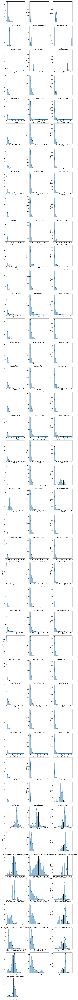

In [53]:
# Visualización de distribuciones
# Seleccionar columnas numéricas
numeric_columns = df.select_dtypes(include=[np.number]).columns

# Crear subplots para las columnas numéricas
num_cols = len(numeric_columns)
fig, axes = plt.subplots(nrows=(num_cols // 3) + 1, ncols=3, figsize=(15, 5 * ((num_cols // 3) + 1)))
axes = axes.flatten()

for i, column in enumerate(numeric_columns):
    sns.histplot(df[column], kde=True, bins=30, ax=axes[i])
    axes[i].set_title(f"Distribución de {column}")
    axes[i].set_xlabel(column)
    axes[i].set_ylabel("Frecuencia")

# Eliminar ejes vacíos si hay menos subplots que espacios
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

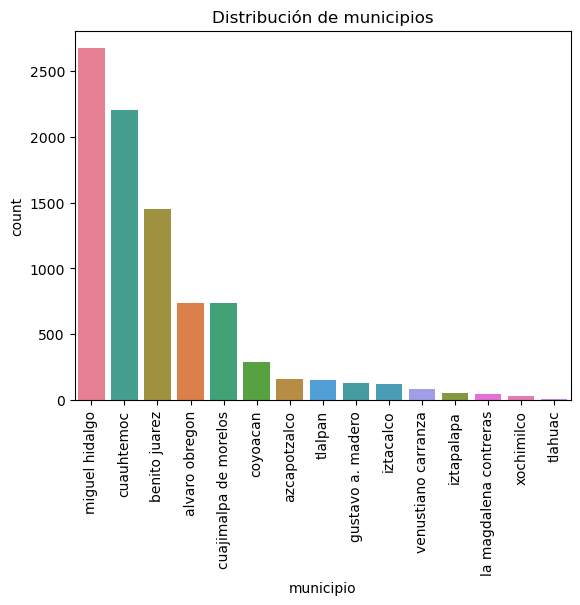

In [54]:
municipio_order = df['municipio'].value_counts().index

sns.countplot(data=df, x='municipio', order=municipio_order, hue='municipio')
plt.xticks(rotation=90)
plt.title('Distribución de municipios')
plt.show()

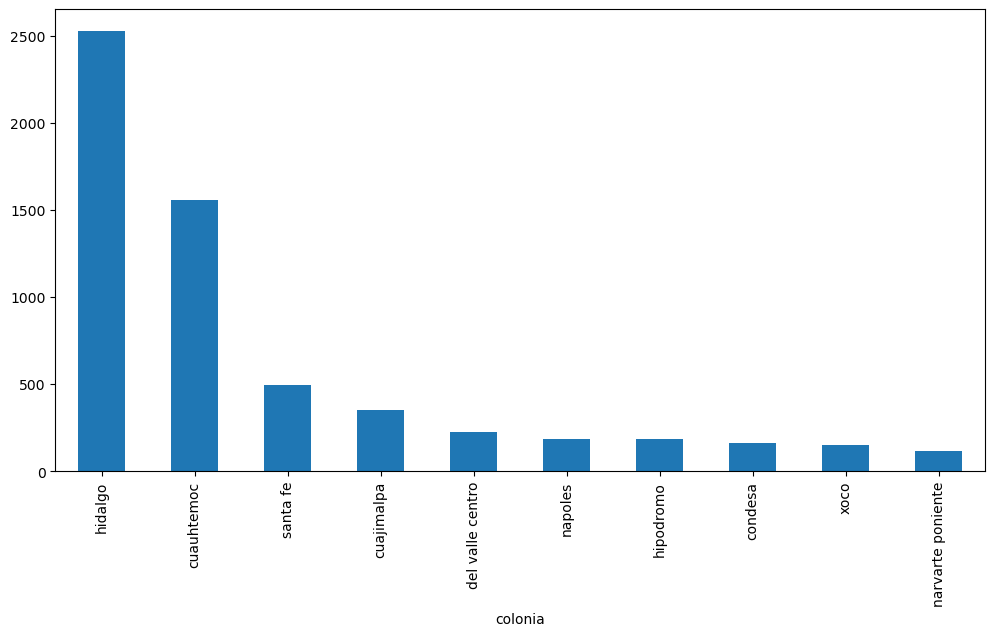

In [55]:
df.colonia.value_counts().head(10).plot(kind='bar', figsize=(12,6))
plt.show()

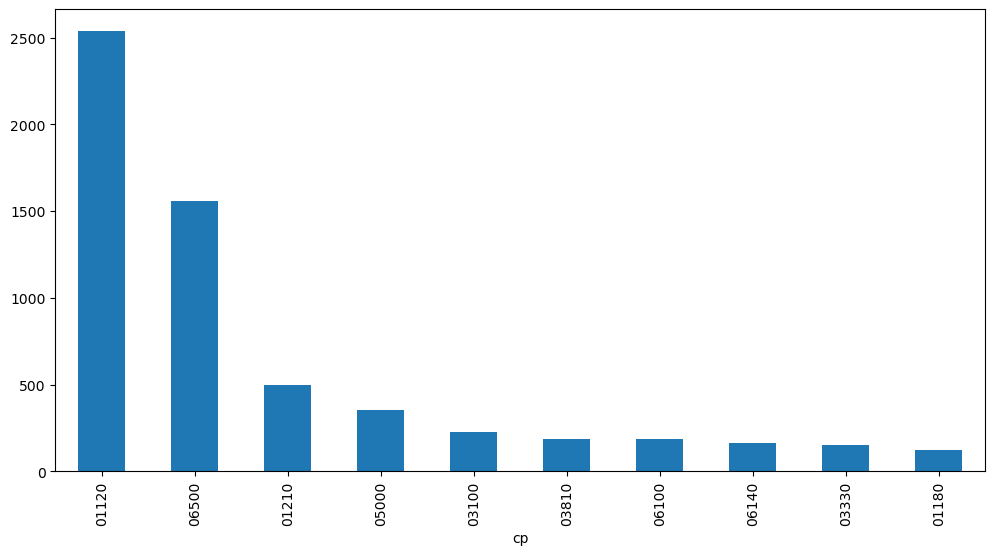

In [56]:
# Un CP puede contener varias colonias, así que nos quedamos sólo con colonias
df.cp.value_counts().head(10).plot(kind='bar', figsize=(12,6))
plt.show()

In [57]:
top10_cols= list(df.colonia.value_counts().head(10).index)

In [58]:
df['colonia_top10'] = df['colonia'].where(df['colonia'].isin(top10_cols), 'otros')

/var/folders/c7/mdvpp7_n2dj49y88d6cj51kc0000gn/T/ipykernel_38397/2711523768.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['colonia_top10'] = df['colonia'].where(df['colonia'].isin(top10_cols), 'otros')


# Preprocesamiento de Datos
Aplica técnicas de limpieza de datos, manejo de valores nulos y codificación de variables categóricas.

In [59]:
# Identificar valores nulos en el DataFrame
print("\nValores nulos por columna:")
df.isnull().sum().sort_values(ascending=False)[:20]


Valores nulos por columna:


quarter                                                  8611
poi_lat_stc_metro_estaciones_utm14n_con_coordenadas      1269
poi_lon_stc_metro_estaciones_utm14n_con_coordenadas      1269
poi_lat_metrobus_estaciones_con_coordenadas              1180
poi_lon_metrobus_estaciones_con_coordenadas              1180
poi_lat_hospitales_y_centros_de_salud_con_coordenadas     348
poi_lon_hospitales_y_centros_de_salud_con_coordenadas     348
CVESEG3                                                   305
CVEVIAL3                                                  305
TIPOVR3                                                   305
NOMREF3                                                   305
poi_lat_areas_verdes_filtrado                              98
poi_lon_areas_verdes_filtrado                              98
poi_lon_escuelas_publicas                                  97
poi_lon_escuelas_privadas_con_coordenadas                  97
poi_lat_escuelas_privadas_con_coordenadas                  97
poi_lat_

In [60]:
# outliers
# Función para detectar outliers usando el método del rango intercuartílico (IQR) 
def detectar_outliers_iqr(data, columna):
    Q1 = data[columna].quantile(0.25)
    Q3 = data[columna].quantile(0.75)
    IQR = Q3 - Q1
    limite_inferior = Q1 - 1.5 * IQR
    limite_superior = Q3 + 1.5 * IQR
    outliers = data[(data[columna] < limite_inferior) | (data[columna] > limite_superior)]
    return outliers


Número de outliers en PROM_OCUP: 0

Número de outliers en lote_m2: 674
    lote_m2
0       280
23      300
31      700
32      359
43      600

Número de outliers en P_0A2: 729
    P_0A2
14   13.0
22   18.0
23   18.0
24   14.0
30   21.0

Número de outliers en VPH_CVJ: 734
    VPH_CVJ
11     63.0
13     72.0
14     56.0
17     63.0
19     65.0

Número de outliers en VPH_DRENAJ: 359
     VPH_DRENAJ
55        451.0
56        453.0
57        359.0
99        294.0
126       247.0

Número de outliers en PRO_OCUP_C: 6
       PRO_OCUP_C
686          3.28
764          1.80
4924         3.28
9712         3.28
12414        1.79

Número de outliers en P_15A17_F: 1170
    P_15A17_F
21       15.0
24       15.0
30       21.0
31       15.0
49        8.0

Número de outliers en VPH_1DOR: 374
     VPH_1DOR
55      155.0
56       91.0
57       78.0
99       99.0
124      95.0

Número de outliers en P_8A14: 881
    P_8A14
9     35.0
21    60.0
22    46.0
23    46.0
24    36.0

Número de outliers en VPH_IN

/var/folders/c7/mdvpp7_n2dj49y88d6cj51kc0000gn/T/ipykernel_38397/2478390224.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(8, 4))



Número de outliers en dist_m_stc_metro_estaciones_utm14n_con_coordenadas: 627
     dist_m_stc_metro_estaciones_utm14n_con_coordenadas
7                                          2951.522031 
29                                         2401.893063 
80                                         2391.787730 
86                                         4020.680133 
106                                        2142.583901 

Número de outliers en TVIVHAB: 362
     TVIVHAB
55     460.0
56     465.0
57     360.0
99     294.0
126    247.0

Número de outliers en P_18YMAS_M: 449
    P_18YMAS_M
19       301.0
21       283.0
55       603.0
56       614.0
57       431.0

Número de outliers en P_0A2_F: 1762
    P_0A2_F
7       3.0
9       4.0
11      5.0
13      6.0
14      6.0

Número de outliers en P_12A14_M: 1162
    P_12A14_M
9         9.0
19        8.0
21       16.0
24        8.0
30       17.0

Número de outliers en P_18YMAS_F: 517
    P_18YMAS_F
19       319.0
21       321.0
31       311.0
55       68

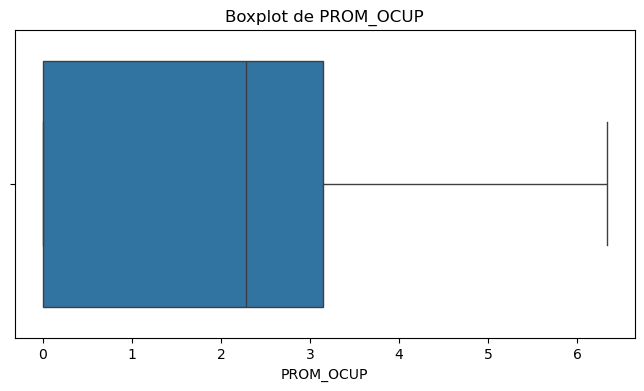

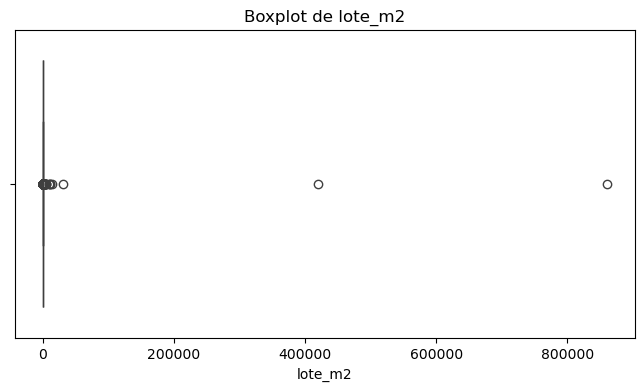

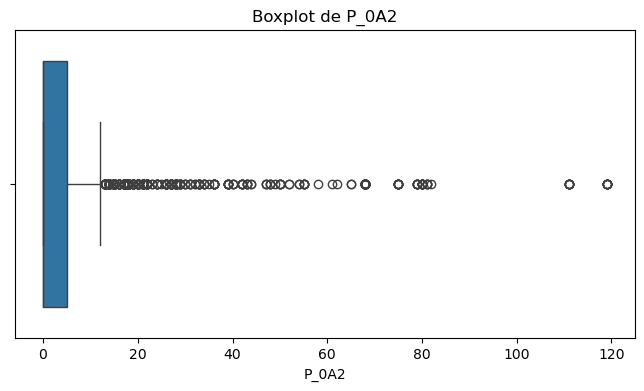

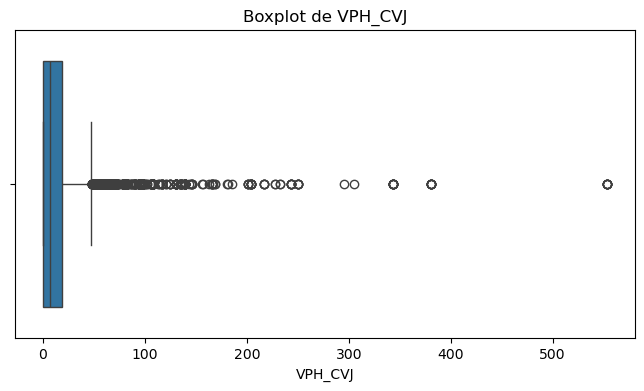

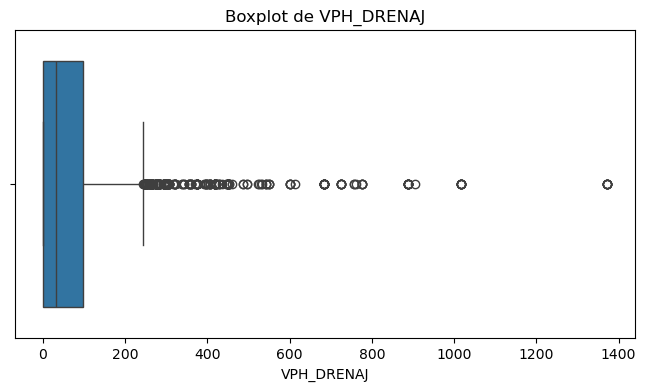

...

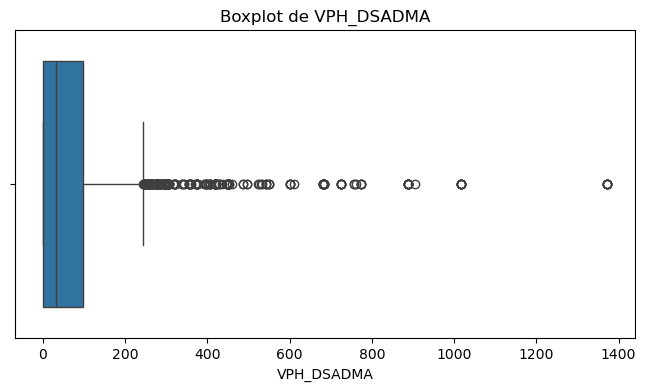

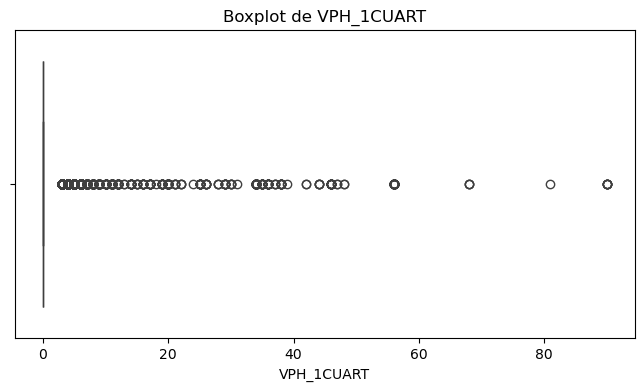

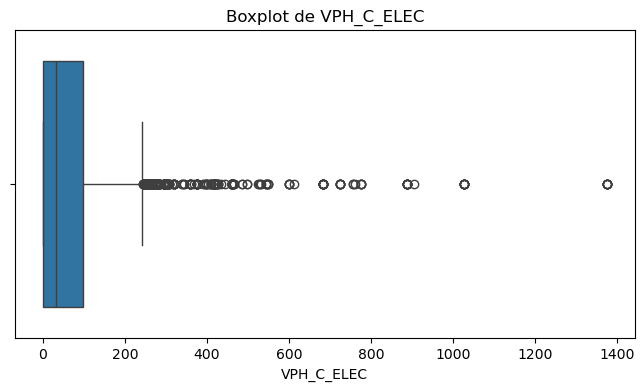

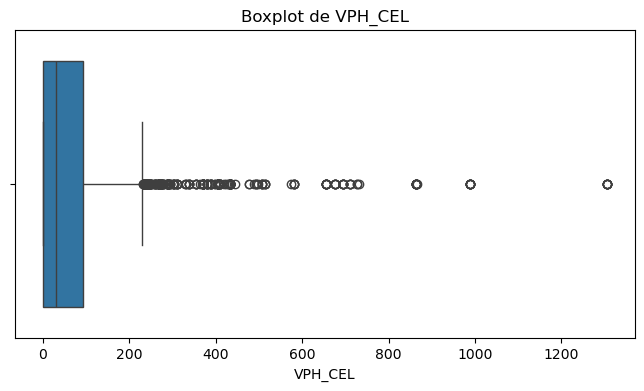

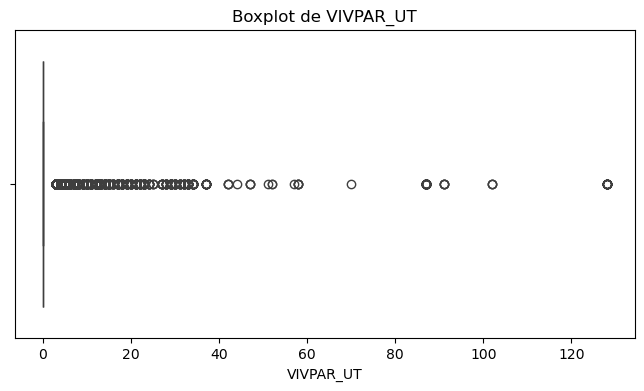

In [61]:
# Aplicar la función a las columnas numéricas
for col in numeric_cols:
    outliers = detectar_outliers_iqr(df, col)
    print(f"\nNúmero de outliers en {col}: {len(outliers)}")
    if len(outliers) > 0:
        print(outliers[[col]].head())
    # Visualizar outliers
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=df[col])
    plt.title(f"Boxplot de {col}")  

identificamos 2 outliers evidentes y muy seprados del resto de los datos en lote_m2, los cuales eliminamos

In [62]:
df.sort_values('lote_m2', ascending=False).head(10)

,precio_mxn,lote_m2,recamaras,baños,estacionamiento,es_amueblado,es_penthouse,direccion,colonia,cp,...,poi_lat_stc_metro_estaciones_utm14n_con_coordenadas,poi_lon_stc_metro_estaciones_utm14n_con_coordenadas,dist_m_areas_verdes_filtrado,poi_lat_areas_verdes_filtrado,poi_lon_areas_verdes_filtrado,dist_m_escuelas_publicas,poi_lat_escuelas_publicas,poi_lon_escuelas_publicas,source_file,colonia_top10
2593,26000.0,860000,2.0,2.0,2.0,1,0,revillagigedo 18 centro cuauhtemoc,cuauhtemoc,06500,...,19.433250,-99.147683,281.885327,19.433065,-99.143597,426.461585,19.432534,-99.150319,final_merged_inmuebles24_2025-10-05.parquet,cuauhtemoc
2481,19000.0,420000,1.0,1.0,1.0,0,0,alvaro obregon guadalupe inn guadalupe inn a...,guadalupe inn,01020,...,19.346252,-99.180757,454.802903,19.351748,-99.194541,88.069189,19.350273,-99.190434,final_merged_inmuebles24_2025-10-05.parquet,otros
1503,50000.0,30468,3.0,3.0,3.0,0,0,lomas del pedregal lomas del pedregal tlalpan,tlalpan,14000,...,NaN,NaN,469.745148,19.275668,-99.210749,143.937176,19.273430,-99.213610,final_merged_inmuebles24_2025-10-05.parquet,otros
90,20000.0,13000,2.0,2.0,1.0,0,0,av. victor hugo portales norte benito juarez,portales norte,03303,...,19.369925,-99.141574,754.557748,19.374718,-99.142808,277.255592,19.369272,-99.150694,final_merged_inmuebles24_2025-10-05.parquet,otros
7617,37000.0,10000,2.0,2.0,2.0,0,0,lago andromaco ampliacion granada miguel hidalgo,hidalgo,01120,...,19.445008,-99.191767,613.377374,19.448045,-99.205063,2221.805629,19.424438,-99.195322,final_merged_inmuebles24_2025-09-14.parquet,hidalgo
24090,30000.0,9974,1.0,1.0,0.0,0,0,rio churubusco 601 xoco benito juarez,xoco,03330,...,19.361359,-99.170862,342.985828,19.363022,-99.168900,358.999274,19.363044,-99.168005,final_merged_inmuebles24_2025-10-11.parquet,xoco
2834,32500.0,9140,2.0,2.0,1.0,0,0,avenida benjamin franklin hipodromo condesa c...,hipodromo,06100,...,19.406109,-99.178923,228.498523,19.408557,-99.179808,170.817647,19.406790,-99.182687,final_merged_inmuebles24_2025-10-05.parquet,hipodromo
20823,37000.0,5000,3.0,2.0,2.0,0,0,loma de la palma 29 lomas de vista hermosa cu...,cuajimalpa,05000,...,NaN,NaN,470.579805,19.363232,-99.275964,432.012883,19.369868,-99.280746,final_merged_inmuebles24_2025-10-11.parquet,cuajimalpa
623,49000.0,5000,3.0,3.0,2.0,0,0,cumbres de santa fe santa fe cuajimalpa cuaji...,santa fe,01210,...,NaN,NaN,293.788694,19.347560,-99.266079,1111.663481,19.342110,-99.254498,final_merged_inmuebles24_2025-10-05.parquet,santa fe
18460,10400.0,4000,2.0,2.0,1.0,0,0,prolongacion ocote san jose de los cedros cua...,los cedros,01510,...,NaN,NaN,177.966467,19.371930,-99.291273,316.257363,19.372194,-99.288315,final_merged_inmuebles24_2025-09-27.parquet,otros


In [63]:
# Identificar los índices de los dos outliers más grandes
outliers = df.sort_values('lote_m2', ascending=False).head(2).index

In [64]:
# Eliminar los outliers del DataFrame
df = df.drop(outliers)


In [65]:
categorical_columns = list(df.select_dtypes(include=["object", "category"]).columns)
categorical_columns.remove('direccion')

In [66]:
df = pd.get_dummies(df, columns=['municipio','colonia_top10'], drop_first=True)

In [67]:
df.head()

,precio_mxn,lote_m2,recamaras,baños,estacionamiento,es_amueblado,es_penthouse,direccion,colonia,cp,...,colonia_top10_cuajimalpa,colonia_top10_cuauhtemoc,colonia_top10_del valle centro,colonia_top10_hidalgo,colonia_top10_hipodromo,colonia_top10_napoles,colonia_top10_narvarte poniente,colonia_top10_otros,colonia_top10_santa fe,colonia_top10_xoco
0,70000.0,280,2.0,2.0,4.0,1,0,calle monte camerun 145 lomas de chapultepec ...,hidalgo,01120,...,False,False,False,True,False,False,False,False,False,False
1,63000.0,99,2.0,2.0,1.0,1,0,vazquez de mella polanco miguel hidalgo,hidalgo,01120,...,False,False,False,True,False,False,False,False,False,False
2,45000.0,150,3.0,2.0,1.0,1,0,masaryk polanco miguel hidalgo,hidalgo,01120,...,False,False,False,True,False,False,False,False,False,False
3,15500.0,60,2.0,1.0,1.0,0,0,ampliacion daniel garza ampliacion daniel garz...,hidalgo,01120,...,False,False,False,True,False,False,False,False,False,False
4,29500.0,90,2.0,2.0,2.0,0,0,lago meru 65 granada miguel hidalgo,hidalgo,01120,...,False,False,False,True,False,False,False,False,False,False


In [68]:
df.shape

(8893, 191)

# Clustering
Realiza un análisis de clustering para agrupar los datos en diferentes segmentos.

In [69]:
df_analysis = df[numeric_cols].copy()

In [70]:
#df_analysis['random'] = np.random.rand(len(df_analysis))

In [71]:
cols = df_analysis.columns

In [72]:
# Escalar los datos
scaler = StandardScaler()
df_analysis[cols] = scaler.fit_transform(df_analysis[cols])

In [73]:
## Arreglar los nulos y quitar esta celda
df_analysis = df_analysis.dropna()

In [74]:
df_analysis.dtypes[120:]

Series([], dtype: object)

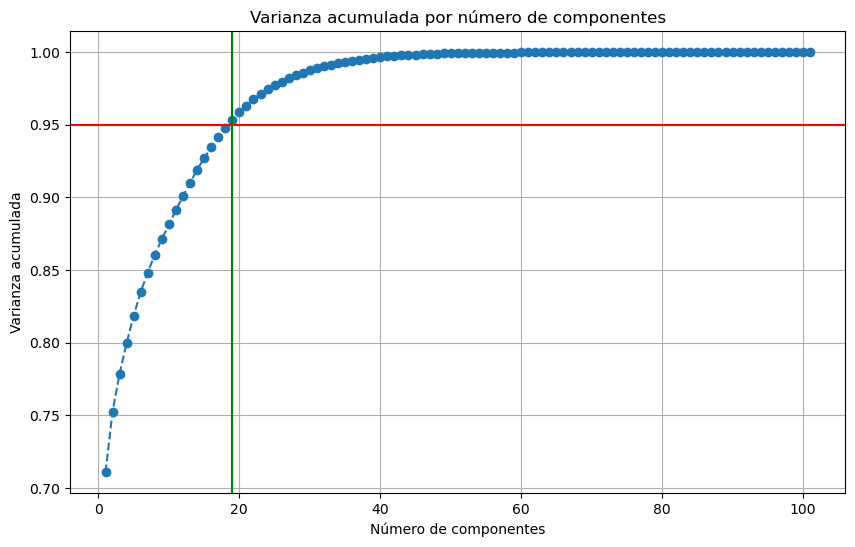

Número óptimo de componentes: 19


In [75]:
# Crear el modelo PCA sin especificar n_components
pca = PCA()
pca.fit(df_analysis)

# Calcular la varianza acumulada
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

#Gráfica de la varianza acumulada
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o', linestyle='--')
plt.title('Varianza acumulada por número de componentes')
plt.xlabel('Número de componentes')
plt.ylabel('Varianza acumulada')
plt.axhline(y=0.95, color='r', linestyle='-')
plt.axvline(x=np.argmax(cumulative_variance >= 0.95) + 1, color='g', linestyle='-')
plt.grid()
plt.show()

# Elegir el número de componentes que expliquen al menos el 95% de la varianza
n_components = np.argmax(cumulative_variance >= 0.95) + 1
print(f"Número óptimo de componentes: {n_components}")



In [76]:
print("Varianza acumulada:")
print(cumulative_variance)


Varianza acumulada:
[0.71080884 0.75247505 0.77859171 0.7998612  0.81870907 0.83502746
 0.84825767 0.86071569 0.87139464 0.8814061  0.89135582 0.90082048
 0.91002407 0.91912829 0.92699757 0.93461827 0.9413752  0.94779049
 0.95355057 0.95861797 0.96314888 0.9676238  0.97143821 0.97445119
 0.97715044 0.9797965  0.98206493 0.98403468 0.98585269 0.9875588
 0.98899744 0.99030688 0.99146286 0.99246322 0.99331992 0.99408438
 0.99479057 0.99543203 0.99604004 0.99663895 0.99707581 0.99743111
 0.99774948 0.99805648 0.99834343 0.99855985 0.99876027 0.9989533
 0.99912732 0.99927509 0.99939094 0.99946439 0.99952625 0.99958691
 0.99964055 0.9996908  0.99973473 0.99977195 0.9998068  0.99983508
 0.99986045 0.99988296 0.99990274 0.99991839 0.9999332  0.99994605
 0.99995575 0.99996348 0.99997049 0.99997643 0.99998089 0.99998393
 0.99998656 0.99998873 0.9999907  0.99999232 0.99999388 0.99999532
 0.99999655 0.99999749 0.99999797 0.99999839 0.99999876 0.99999903
 0.99999927 0.99999946 0.99999961 0.99999974

In [77]:
# Aplicar PCA con el número óptimo de componentes
pca = PCA(n_components=n_components)
pca_data = pca.fit_transform(df_analysis)

In [78]:
# Importancia de cada componente (varianza explicada)
explained_variance = pca.explained_variance_ratio_
print("Varianza explicada por cada componente:")
for i, var in enumerate(explained_variance):
    print(f"Componente {i+1}: {var:.2%}")

Varianza explicada por cada componente:
Componente 1: 71.08%
Componente 2: 4.17%
Componente 3: 2.61%
Componente 4: 2.13%
Componente 5: 1.88%
Componente 6: 1.63%
Componente 7: 1.32%
Componente 8: 1.25%
Componente 9: 1.07%
Componente 10: 1.00%
Componente 11: 0.99%
Componente 12: 0.95%
Componente 13: 0.92%
Componente 14: 0.91%
Componente 15: 0.79%
Componente 16: 0.76%
Componente 17: 0.68%
Componente 18: 0.64%
Componente 19: 0.58%


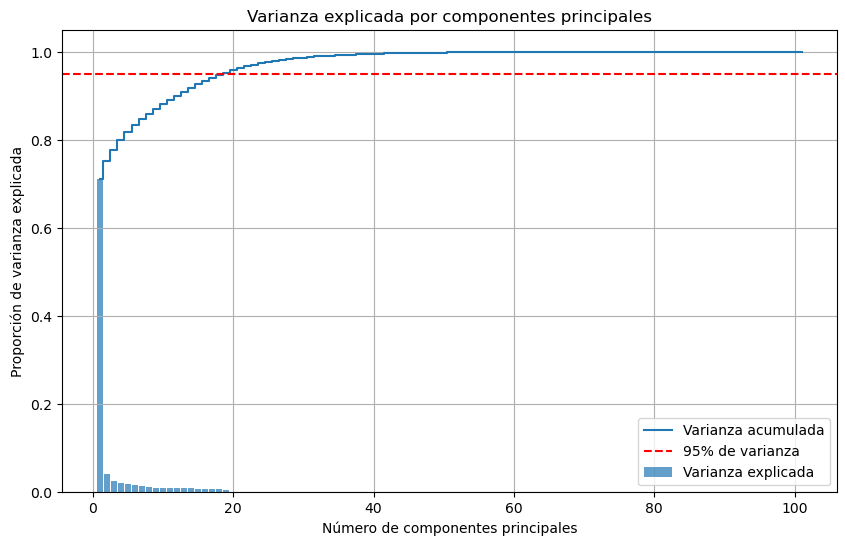

In [79]:
# Gráfica de varianza explicada por cada componente
plt.figure(figsize=(10, 6))
plt.bar(range(1, len(explained_variance) + 1), explained_variance, alpha=0.7, label='Varianza explicada')
plt.step(range(1, len(cumulative_variance) + 1), cumulative_variance, where='mid', label='Varianza acumulada')
plt.axhline(y=0.95, color='r', linestyle='--', label='95% de varianza')
plt.xlabel('Número de componentes principales')
plt.ylabel('Proporción de varianza explicada')
plt.title('Varianza explicada por componentes principales')
plt.legend(loc='best')
plt.grid()
plt.show()

In [80]:
# Contribución de las características originales a los primeros 22 componentes
components = pd.DataFrame(pca.components_[:20], columns=df_analysis.columns)
print("\nContribución de las características originales a los primeros 22 componentes:")
components.T.sort_values(by = 0, ascending=False)


Contribución de las características originales a los primeros 22 componentes:


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
P_18YMAS,0.117690,0.007401,0.013364,-0.007147,-0.014515,0.011003,-0.011370,0.005417,0.003226,-0.015835,-0.005929,-0.003934,0.008312,-0.007406,-0.007665,0.017476,0.016709,-0.008813,0.012342
OCUPVIVPAR,0.117551,0.034080,-0.000393,0.000195,-0.019604,0.013448,-0.012578,0.004437,0.001978,-0.000661,-0.000518,0.000986,0.000461,0.003421,0.008530,0.005235,0.003958,-0.004992,0.008270
POBHOG,0.117551,0.034080,-0.000393,0.000195,-0.019604,0.013448,-0.012578,0.004437,0.001978,-0.000661,-0.000518,0.000986,0.000461,0.003421,0.008530,0.005235,0.003958,-0.004992,0.008270
P_18YMAS_M,0.117539,0.002180,0.002756,-0.004909,-0.008523,0.001080,-0.005187,0.006925,0.003911,-0.009321,0.001558,-0.001234,0.004171,-0.000978,-0.001074,0.013253,0.000622,-0.012841,0.014024
POBTOT,0.117524,0.034718,0.000319,-0.000081,-0.020905,0.014911,-0.015134,0.006445,0.001073,-0.001320,-0.001656,0.000707,0.001473,0.001525,0.006164,0.008666,0.008542,-0.004718,0.008305
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
es_penthouse,-0.001163,0.004814,0.106362,0.210029,0.066229,-0.028191,-0.045158,-0.051885,0.078714,0.110592,-0.054676,-0.286415,0.445624,0.766674,-0.195611,0.041142,-0.010659,0.038923,0.022583
dist_m_escuelas_privadas_con_coordenadas,-0.002488,0.041530,0.066402,-0.067780,-0.028202,0.079992,0.367388,0.541650,-0.119432,-0.026774,0.140399,0.069919,-0.052135,0.125856,0.020304,0.593652,-0.056959,0.216877,-0.267581
es_amueblado,-0.008366,-0.024112,-0.083224,-0.070187,-0.039730,0.025513,0.192696,0.097201,0.615740,0.264469,-0.288518,-0.094519,0.376169,-0.252336,0.333602,0.096267,-0.150037,0.086612,0.137811
dist_m_hospitales_y_centros_de_salud_con_coordenadas,-0.009568,-0.087667,-0.082378,0.161160,0.017401,0.031115,-0.173588,0.453505,-0.302902,0.382141,-0.049596,-0.005119,0.307822,-0.276088,-0.261901,-0.198647,-0.009413,-0.174315,-0.016555


In [81]:
most_important_features = components.iloc[0].abs().sort_values(ascending=False).head(35)
print("Características más importantes del primer componente:")
print(most_important_features)

Características más importantes del primer componente:
P_18YMAS      0.117690
OCUPVIVPAR    0.117551
POBHOG        0.117551
P_18YMAS_M    0.117539
POBTOT        0.117524
P_18YMAS_F    0.117451
POBMAS        0.117400
POBFEM        0.117364
P_15A49_F     0.117151
VPH_TV        0.116853
TVIVHAB       0.116736
TVIVPARHAB    0.116735
TOTHOG        0.116735
VIVPARH_CV    0.116734
VPH_C_ELEC    0.116734
PHOGJEF_M     0.116733
VPH_AGUADV    0.116722
VPH_AEASP     0.116722
VPH_EXCSA     0.116699
VPH_DRENAJ    0.116670
VPH_C_SERV    0.116657
VPH_DSADMA    0.116652
HOGJEF_M      0.116499
VPH_CEL       0.116352
VPH_REFRI     0.116315
VPH_RADIO     0.116241
PHOGJEF_F     0.116182
VPH_LAVAD     0.116145
P18YM_PB      0.115754
P18YM_PB_F    0.115611
VPH_2YMASD    0.115542
P18YM_PB_M    0.115425
VPH_3YMASC    0.115207
VIVTOT        0.115009
VPH_TELEF     0.114982
Name: 0, dtype: float64


In [82]:
# Reconstrucción aproximada de los datos originales
reconstructed_data = pca.inverse_transform(pca_data)

In [83]:

# Comparar los datos originales con los reconstruidos
print("Datos originales (primeras filas):")
df_analysis.head()

Datos originales (primeras filas):


,PROM_OCUP,lote_m2,P_0A2,VPH_CVJ,VPH_DRENAJ,PRO_OCUP_C,P_15A17_F,VPH_1DOR,P_8A14,VPH_INTER,...,dist_m_escuelas_privadas_con_coordenadas,POBTOT,P_6A11_F,VPH_C_SERV,POBMAS,VPH_DSADMA,VPH_1CUART,VPH_C_ELEC,VPH_CEL,VIVPAR_UT
0,-1.344195,0.352034,-0.402423,-0.515202,-0.612996,-1.300601,-0.41461,-0.622029,-0.469335,-0.611362,...,0.493619,-0.590204,-0.457228,-0.612953,-0.588962,-0.612790,-0.271494,-0.611646,-0.609303,-0.289497
1,0.976449,-0.080422,-0.402423,-0.308248,-0.201436,0.595146,-0.41461,-0.165387,-0.125344,-0.164615,...,-0.224095,-0.128300,0.079803,-0.201159,-0.149525,-0.200918,-0.271494,-0.201522,-0.190510,-0.289497
2,0.572253,0.041430,-0.103297,-0.367378,-0.309225,0.565524,-0.41461,-0.287158,-0.125344,-0.320976,...,0.061427,-0.299864,-0.188713,-0.309010,-0.337855,-0.308789,-0.271494,-0.308936,-0.343727,-0.289497
3,-1.344195,-0.173603,-0.402423,-0.515202,-0.612996,-1.300601,-0.41461,-0.622029,-0.469335,-0.611362,...,-0.575204,-0.590204,-0.457228,-0.612953,-0.588962,-0.612790,-0.271494,-0.611646,-0.609303,-0.289497
4,-1.344195,-0.101925,-0.402423,-0.515202,-0.612996,-1.300601,-0.41461,-0.622029,-0.469335,-0.611362,...,-1.164337,-0.590204,-0.457228,-0.612953,-0.588962,-0.612790,-0.271494,-0.611646,-0.609303,-0.289497


In [84]:
print("\nDatos reconstruidos (primeras filas):")
pd.DataFrame(reconstructed_data, columns=df_analysis.columns).head()


Datos reconstruidos (primeras filas):


,PROM_OCUP,lote_m2,P_0A2,VPH_CVJ,VPH_DRENAJ,PRO_OCUP_C,P_15A17_F,VPH_1DOR,P_8A14,VPH_INTER,...,dist_m_escuelas_privadas_con_coordenadas,POBTOT,P_6A11_F,VPH_C_SERV,POBMAS,VPH_DSADMA,VPH_1CUART,VPH_C_ELEC,VPH_CEL,VIVPAR_UT
0,-1.221741,0.358671,-0.510376,-0.538304,-0.619676,-1.303556,-0.363584,-0.536478,-0.482533,-0.602704,...,0.501574,-0.590648,-0.443322,-0.619464,-0.594858,-0.620009,-0.413017,-0.619386,-0.623107,0.165838
1,0.873979,-0.109519,-0.345320,-0.169493,-0.178266,0.756724,-0.151477,-0.190148,-0.197431,-0.150530,...,-0.205696,-0.156082,-0.150575,-0.177916,-0.178131,-0.177231,-0.487712,-0.180242,-0.183918,-0.399607
2,0.602506,0.009776,-0.299517,-0.367553,-0.337611,0.569790,-0.223439,-0.320941,-0.231410,-0.343636,...,0.023489,-0.281375,-0.209129,-0.337731,-0.284882,-0.336904,-0.229599,-0.337866,-0.341648,-0.350798
3,-1.329817,-0.222883,-0.422176,-0.541552,-0.611106,-1.267017,-0.373553,-0.610977,-0.470017,-0.617694,...,-0.518907,-0.594024,-0.467902,-0.610909,-0.594319,-0.611002,-0.352296,-0.609484,-0.611647,-0.228456
4,-1.301159,-0.101099,-0.356673,-0.530642,-0.618063,-1.348522,-0.428148,-0.601834,-0.477642,-0.609762,...,-1.139600,-0.592405,-0.447135,-0.617801,-0.600102,-0.618130,-0.306957,-0.614991,-0.610051,-0.275922


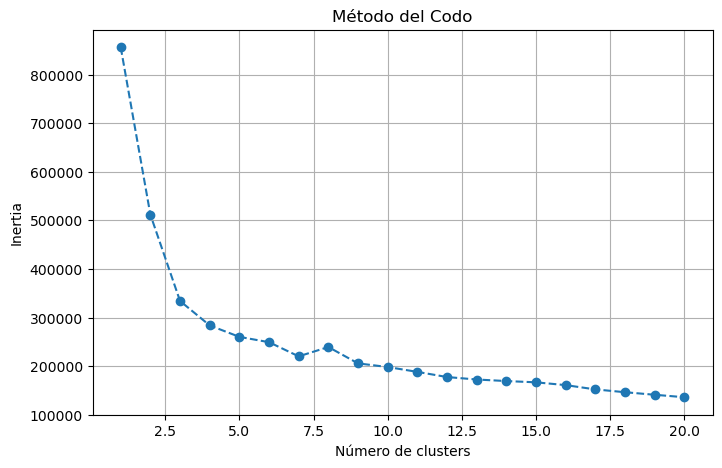

In [85]:
# Calcular la inertia para diferentes números de clusters
inertia = []
for k in range(1, 21):  # Probar de 1 a 10 clusters
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(pca_data)  # Usa los datos reducidos por PCA
    inertia.append(kmeans.inertia_)

# Graficar el método del codo
plt.figure(figsize=(8, 5))
plt.plot(range(1, 21), inertia, marker='o', linestyle='--')
plt.xlabel('Número de clusters')
plt.ylabel('Inertia')
plt.title('Método del Codo')
plt.grid()
plt.show()

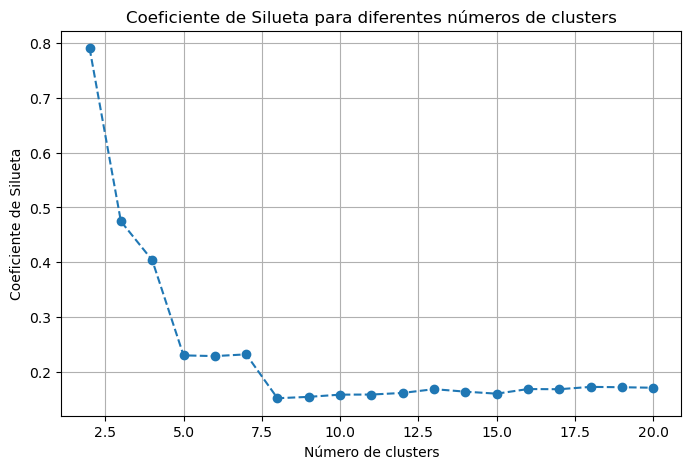

In [86]:
from sklearn.metrics import silhouette_score

# Calcular el coeficiente de silueta para diferentes números de clusters
silhouette_scores = []
for k in range(2, 21):  # Probar de 2 a 10 clusters
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(pca_data)
    score = silhouette_score(pca_data, kmeans.labels_)
    silhouette_scores.append(score)

# Graficar el coeficiente de silueta
plt.figure(figsize=(8, 5))
plt.plot(range(2, 21), silhouette_scores, marker='o', linestyle='--')
plt.xlabel('Número de clusters')
plt.ylabel('Coeficiente de Silueta')
plt.title('Coeficiente de Silueta para diferentes números de clusters')
plt.grid()
plt.show()

In [87]:
# Aplicar el algoritmo K-Means para clustering
num_clusters = 4
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
clusters = kmeans.fit_predict(df_analysis)

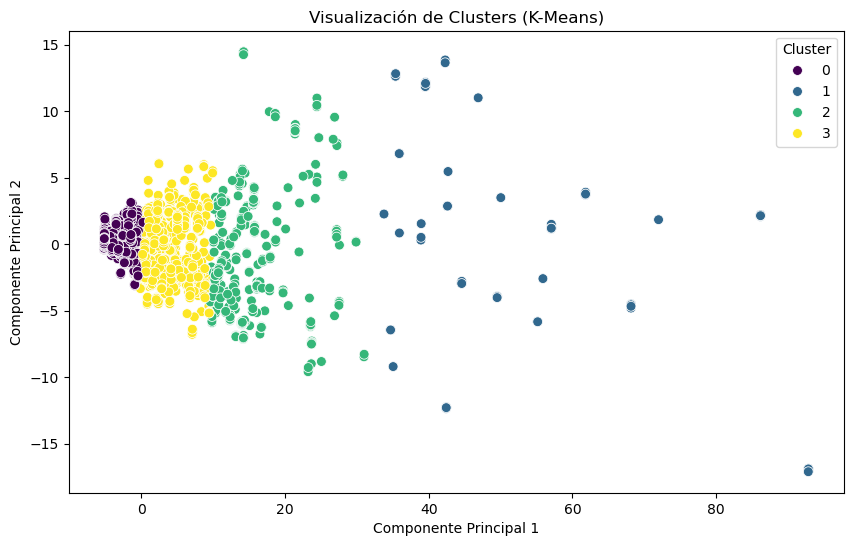

In [88]:

# Agregar los clusters al DataFrame original
df_analysis['Cluster'] = clusters

# Visualizar los clusters en el espacio reducido por PCA
plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_data[:, 0], y=pca_data[:, 1], hue=clusters, palette="viridis", s=50)
plt.title("Visualización de Clusters (K-Means)")
plt.xlabel("Componente Principal 1")
plt.ylabel("Componente Principal 2")
plt.legend(title="Cluster")
plt.show()

In [89]:
import plotly.express as px

# Crear un DataFrame con los datos de PCA y clusters
df_pca = pd.DataFrame(pca_data[:,:3], columns=['PC1', 'PC2', 'PC3'])  # Asegúrate de que pca_data tenga al menos 3 componentes
df_pca['Cluster'] = clusters  # Agregar los clusters al DataFrame

# Graficar en 3D con plotly
fig = px.scatter_3d(
    df_pca,
    x='PC1', y='PC2', z='PC3',  # Ejes del gráfico
    color='Cluster',            # Colorear por cluster
    title="Visualización de Clusters en 3D (K-Means)",
    opacity=0.3,                # Transparencia de los puntos
    size_max=1,                 # Tamaño máximo de los puntos
    symbol_sequence=['circle'], # Usar círculos como símbolo
    color_continuous_scale='Viridis'  # Paleta de colores
)

# Ajustar el tamaño del gráfico
fig.update_layout(
    width=600,  # Ancho del gráfico
    height=600   # Alto del gráfico
)

# Mostrar el gráfico interactivo
fig.show()

In [90]:
# Mostrar el tamaño de cada cluster
cluster_sizes = df_analysis['Cluster'].value_counts()
print("\nTamaño de cada cluster:")
cluster_sizes


Tamaño de cada cluster:


Cluster
0    6137
3    2114
2     517
1     125
Name: count, dtype: int64

In [91]:
# Calcular las características promedio de cada cluster
numeric_columns = df_analysis.select_dtypes('number')
cluster_means = numeric_columns.groupby(df_analysis['Cluster']).mean()
cluster_means.T

Cluster,0,1,2,3
PROM_OCUP,-0.290056,0.937758,0.624931,0.633757
lote_m2,-0.005534,-0.090705,-0.037665,0.030640
P_0A2,-0.341042,6.627452,1.349907,0.268041
VPH_CVJ,-0.378468,5.299138,1.712054,0.366666
VPH_DRENAJ,-0.441928,5.662713,1.879794,0.488374
...,...,...,...,...
VPH_1CUART,-0.226684,2.936800,1.119454,0.210644
VPH_C_ELEC,-0.441181,5.686770,1.876298,0.485635
VPH_CEL,-0.438759,5.668250,1.871167,0.480956
VIVPAR_UT,-0.202305,0.954505,0.461338,0.418034


In [92]:
df_analysis.columns

Index(['PROM_OCUP', 'lote_m2', 'P_0A2', 'VPH_CVJ', 'VPH_DRENAJ', 'PRO_OCUP_C',
       'P_15A17_F', 'VPH_1DOR', 'P_8A14', 'VPH_INTER',
       ...
       'POBTOT', 'P_6A11_F', 'VPH_C_SERV', 'POBMAS', 'VPH_DSADMA',
       'VPH_1CUART', 'VPH_C_ELEC', 'VPH_CEL', 'VIVPAR_UT', 'Cluster'],
      dtype='object', length=102)

In [93]:
loadings = pd.DataFrame(
            pca.components_.T,
            columns=[f'PC{i+1}' for i in range(pca.n_components_)],
            index=df_analysis.drop('Cluster',axis =1).columns
        )

In [94]:
feature_importance_pca = np.sum(
            loadings.abs() * pca.explained_variance_ratio_, axis=1
        )
feature_importance_pca = feature_importance_pca.sort_values(ascending=False)

In [95]:
pd.set_option('display.max_rows', None)  # Mostrar todas las filas
feature_importance_pca.sort_values(ascending=False, inplace = True)

In [96]:
feature_importance_pca

P_6A11                                                  0.091671
P_0A2                                                   0.091439
P_0A2_F                                                 0.091193
P_8A14                                                  0.091067
P_8A14_F                                                0.090768
P_6A11_F                                                0.090673
P_60YMAS                                                0.090630
P_60YMAS_M                                              0.090412
VPH_AUTOM                                               0.090266
VPH_STVP                                                0.090177
P_6A11_M                                                0.090139
P_60YMAS_F                                              0.090134
VPH_CVJ                                                 0.090075
VIVTOT                                                  0.090010
POB65_MAS                                               0.089987
VPH_NDACMM               

In [97]:
feature_importance_pca.index

Index(['P_6A11', 'P_0A2', 'P_0A2_F', 'P_8A14', 'P_8A14_F', 'P_6A11_F',
       'P_60YMAS', 'P_60YMAS_M', 'VPH_AUTOM', 'VPH_STVP',
       ...
       'es_amueblado', 'recamaras', 'estacionamiento',
       'dist_m_stc_metro_estaciones_utm14n_con_coordenadas',
       'dist_m_escuelas_privadas_con_coordenadas', 'es_penthouse', 'baños',
       'VPH_SINTIC', 'VPH_SNBIEN', 'lote_m2'],
      dtype='object', length=101)

In [98]:
#random_position = feature_importance_pca.index.get_loc('random')
# Quedarse solo con las features antes de 'random'
#filtered_features = feature_importance_pca.iloc[:random_position]
        

In [99]:
#filtered_features.index

In [100]:
#final_features = list(filtered_features.index)
final_features = list(feature_importance_pca.index)

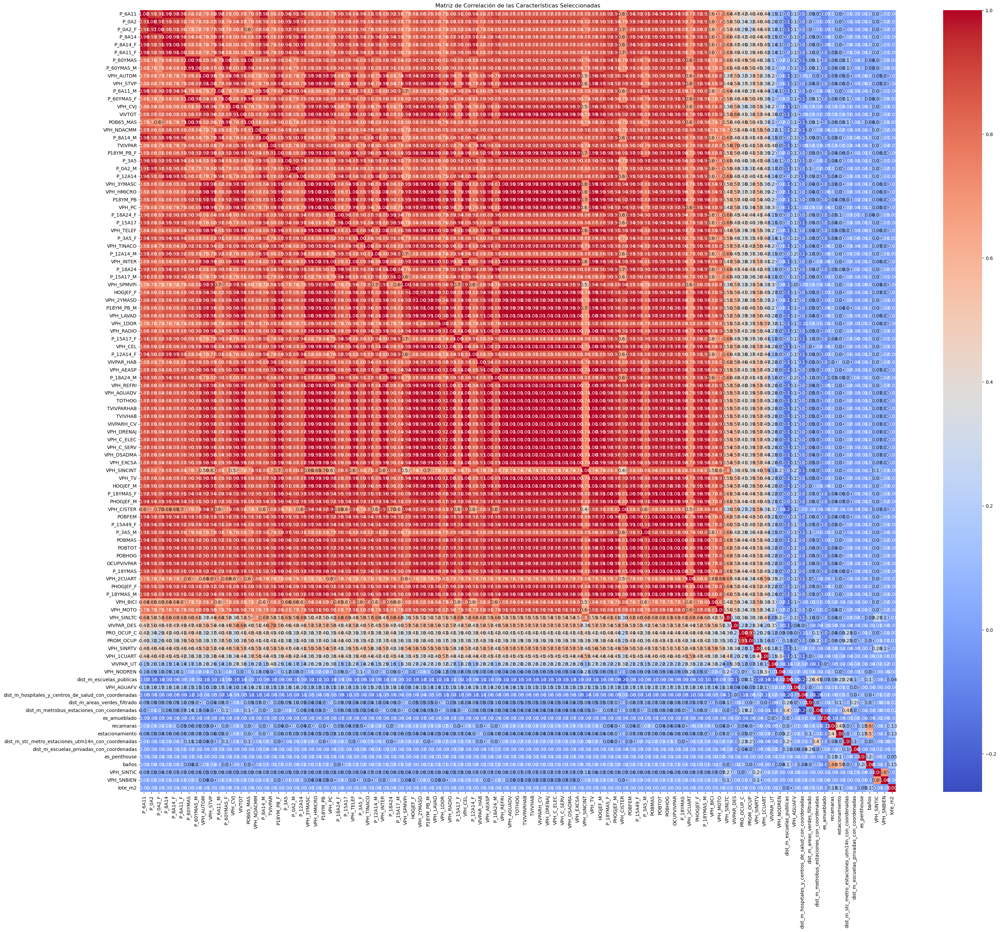

In [101]:
# Calcular la matriz de correlación para las características seleccionadas
correlation_matrix = df[final_features].corr()

# Visualizar la matriz de correlación
plt.figure(figsize=(36, 30))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Matriz de Correlación de las Características Seleccionadas")
plt.show()

In [102]:
# Establecer un umbral para considerar alta correlación
correlation_threshold = 0.60

# Identificar pares de características altamente correlacionadas
high_corr_pairs = []
for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > correlation_threshold:
            high_corr_pairs.append((correlation_matrix.columns[i], correlation_matrix.columns[j]))

print(f"Pares de características altamente correlacionadas (umbral > {correlation_threshold}):")
high_corr_pairs

Pares de características altamente correlacionadas (umbral > 0.6):


[('P_0A2', 'P_6A11'),
 ('P_0A2_F', 'P_6A11'),
 ('P_0A2_F', 'P_0A2'),
 ('P_8A14', 'P_6A11'),
 ('P_8A14', 'P_0A2'),
 ('P_8A14', 'P_0A2_F'),
 ('P_8A14_F', 'P_6A11'),
 ('P_8A14_F', 'P_0A2'),
 ('P_8A14_F', 'P_0A2_F'),
 ('P_8A14_F', 'P_8A14'),
 ('P_6A11_F', 'P_6A11'),
 ('P_6A11_F', 'P_0A2'),
 ('P_6A11_F', 'P_0A2_F'),
 ('P_6A11_F', 'P_8A14'),
 ('P_6A11_F', 'P_8A14_F'),
 ('P_60YMAS', 'P_6A11'),
 ('P_60YMAS', 'P_0A2'),
 ('P_60YMAS', 'P_0A2_F'),
 ('P_60YMAS', 'P_8A14'),
 ('P_60YMAS', 'P_8A14_F'),
 ('P_60YMAS', 'P_6A11_F'),
 ('P_60YMAS_M', 'P_6A11'),
 ('P_60YMAS_M', 'P_0A2'),
 ('P_60YMAS_M', 'P_0A2_F'),
 ('P_60YMAS_M', 'P_8A14'),
 ('P_60YMAS_M', 'P_8A14_F'),
 ('P_60YMAS_M', 'P_6A11_F'),
 ('P_60YMAS_M', 'P_60YMAS'),
 ('VPH_AUTOM', 'P_6A11'),
 ('VPH_AUTOM', 'P_0A2'),
 ('VPH_AUTOM', 'P_0A2_F'),
 ('VPH_AUTOM', 'P_8A14'),
 ('VPH_AUTOM', 'P_8A14_F'),
 ('VPH_AUTOM', 'P_6A11_F'),
 ('VPH_AUTOM', 'P_60YMAS'),
 ('VPH_AUTOM', 'P_60YMAS_M'),
 ('VPH_STVP', 'P_6A11'),
 ('VPH_STVP', 'P_0A2'),
 ('VPH_STVP', 'P_0A

In [103]:
# Crear un conjunto para almacenar las características a eliminar
features_to_remove = set()

# Para cada par de características correlacionadas, eliminar la menos importante según PCA
for feature1, feature2 in high_corr_pairs:
    if feature_importance_pca[feature1] < feature_importance_pca[feature2]:
        features_to_remove.add(feature1)
    else:
        features_to_remove.add(feature2)

# Filtrar las características finales eliminando las correlacionadas menos importantes
final_features_filtered = [feature for feature in final_features if feature not in features_to_remove]

print(f"Características finales después de eliminar correlacionadas: {len(final_features_filtered)}")
final_features_filtered

Características finales después de eliminar correlacionadas: 19


['P_6A11',
 'PRO_OCUP_C',
 'VPH_SINRTV',
 'VPH_1CUART',
 'VIVPAR_UT',
 'VPH_NODREN',
 'dist_m_escuelas_publicas',
 'VPH_AGUAFV',
 'dist_m_hospitales_y_centros_de_salud_con_coordenadas',
 'dist_m_areas_verdes_filtrado',
 'dist_m_metrobus_estaciones_con_coordenadas',
 'es_amueblado',
 'recamaras',
 'estacionamiento',
 'dist_m_stc_metro_estaciones_utm14n_con_coordenadas',
 'dist_m_escuelas_privadas_con_coordenadas',
 'es_penthouse',
 'VPH_SINTIC',
 'lote_m2']

In [104]:
final_features = final_features_filtered.copy()

In [105]:
# Guardar el DataFrame procesado y la lista de características finales
import json

processed_data_path = '../../data/processed/final_processed_data.parquet'
features_path = '../../data/processed/final_features.json'

# Asegurarse de que las columnas de características finales existen en el df
final_cols_to_save = final_features + ['precio_mxn'] + [col for col in df.columns if col.startswith(('municipio_', 'colonia_top10_'))]
df_to_save = df[final_cols_to_save]

df_to_save.to_parquet(processed_data_path)

with open(features_path, 'w') as f:
    json.dump(final_features, f)

print(f"DataFrame procesado guardado en: {processed_data_path}")
print(f"Características finales guardadas en: {features_path}")

DataFrame procesado guardado en: ../../data/processed/final_processed_data.parquet
Características finales guardadas en: ../../data/processed/final_features.json
